In [ ]:
# -*- coding: utf-8 -*-
"""Real Time Violence Detection | MobileNet Bi-LSTM (Optimized with Drive Integration)

Automatically generated by Colab.

Original file is located at
    https://colab.research.google.com/#fileId=https%3A//storage.googleapis.com/kaggle-colab-exported-notebooks/musthafa145/real-time-violence-detection-mobilenet-bi-lstm.a5ce4c3c-7ba7-4db1-8700-5258f37a777e.ipynb%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com/20250522/auto/storage/goog4_request%26X-Goog-Date%3D20250522T080605Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D77e13bae865b0d5e79acab18c3527c23f3db728495d409366be9befa189fcd3a3304635072416e7a7f163e3779c0a73b567149232ca50e65f6b965ab377f6a6ed2e9960c6bc74f25c3381531ac1b051742ec34ed365828efe473ff6fa40d070f2a31a55703d33206a3a31e142a1574229cb227f0d23db2318ad5ebdff4808b9c392e07825149c43feb7d12b1c4e953cd67c0f452f3f96a1c2a0657f7785b558cc608e168289200b7ef863b2d37ae40705d2e047fcb6a781ede02fbb76e45102c8ffb9940c70345daa0c27fe0a81687e2f7a96bd0296643933c50706e86ae64c0b18aeb6f7314c9d63087621a8b2cc2187c122e70103ecea0e0f5396892f5fa1f
"""

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES.
# This cell is typically provided by Kaggle/Colab for dataset integration.
import kagglehub
# The kagglehub.dataset_download function returns the path to a directory
# where the dataset is downloaded. This path is the parent of "Real Life Violence Dataset" folder.
dataset_download_parent_dir = kagglehub.dataset_download('mohamedmustafa/real-life-violence-situations-dataset')
print(f'Kaggle dataset downloaded to a temporary directory: {dataset_download_parent_dir}')
print('Data source import complete.')

"""# **Importing the required libraries**"""
# It's recommended to enable GPU acceleration for this notebook for faster training.
# (Runtime -> Change runtime type -> Hardware accelerator -> GPU)

import os
import shutil # Not actively used in this version but often useful for file management
import cv2
import math # Not actively used
import random
import numpy as np
import datetime as dt # Not actively used
import tensorflow as tf
from collections import deque
import matplotlib.pyplot as plt

# Use a modern seaborn style
try:
    plt.style.use("seaborn-v0_8-darkgrid")
except:
    plt.style.use("seaborn") # Fallback for older versions


from sklearn.model_selection import train_test_split

# Use tensorflow.keras for all Keras components
from tensorflow.keras.layers import Input, TimeDistributed, Dropout, Flatten, LSTM, Bidirectional, Dense
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2

from IPython.display import HTML, display # Added display for explicit rendering in loops
from base64 import b64encode

"""# **Mount Google Drive and Define Paths**"""

from google.colab import drive
drive.mount('/content/drive')

# Define a base path in your Google Drive for storing processed data and models
DRIVE_BASE_PATH = '/content/drive/MyDrive/ViolenceDetectionProject_MobileNetBiLSTM/'
os.makedirs(DRIVE_BASE_PATH, exist_ok=True)

# Paths for saved numpy arrays
FEATURES_PATH = os.path.join(DRIVE_BASE_PATH, "features.npy")
LABELS_PATH = os.path.join(DRIVE_BASE_PATH, "labels.npy")
VIDEO_FILES_PATHS_PATH = os.path.join(DRIVE_BASE_PATH, "video_files_paths.npy")

# Path for the trained model
MODEL_H5_PATH = os.path.join(DRIVE_BASE_PATH, "MoBiLSTM_model.h5")
MODEL_PLOT_PATH = os.path.join(DRIVE_BASE_PATH, 'MobBiLSTM_model_structure_plot.png')

# Path for output test videos
OUTPUT_VIDEO_DIR = os.path.join(DRIVE_BASE_PATH, 'test_videos_output')
os.makedirs(OUTPUT_VIDEO_DIR, exist_ok=True)

print(f"Using Google Drive Path: {DRIVE_BASE_PATH} for processed data and models.")

"""# **Define Dataset Constants and Paths**"""

# The actual dataset is in a subfolder named "Real Life Violence Dataset"
# inside the directory path returned by kagglehub.dataset_download.
DATASET_DIR = os.path.join(dataset_download_parent_dir, "Real Life Violence Dataset")
NonViolnceVideos_Dir = os.path.join(DATASET_DIR, "NonViolence")
ViolnceVideos_Dir = os.path.join(DATASET_DIR, "Violence")


# Check if paths exist
if not os.path.exists(NonViolnceVideos_Dir):
    print(f"ERROR: NonViolence directory not found at {NonViolnceVideos_Dir}")
if not os.path.exists(ViolnceVideos_Dir):
    print(f"ERROR: Violence directory not found at {ViolnceVideos_Dir}")
if not os.path.exists(DATASET_DIR):
     print(f"ERROR: Main dataset directory not found at {DATASET_DIR}")


# Specify the height and width to which each video frame will be resized.
IMAGE_HEIGHT , IMAGE_WIDTH = 64, 64
# Specify the number of frames of a video that will be fed to the model as one sequence.
SEQUENCE_LENGTH = 16
# List of class names
CLASSES_LIST = ["NonViolence","Violence"]

"""# **Visualize the Data (Optional)**"""

def Play_Video(filepath):
    if not os.path.exists(filepath):
        print(f"Error: Video file not found at {filepath}")
        return HTML(f"<p>Error: Video file not found at {filepath}</p>")
    html = ''
    # Reading the video file in binary mode
    with open(filepath,'rb') as video_file:
        video = video_file.read()
    src = 'data:video/mp4;base64,' + b64encode(video).decode()
    # Displaying the video
    html += '<video width=640 muted controls autoplay loop><source src="%s" type="video/mp4"></video>' % src
    return HTML(html)

if os.path.exists(NonViolnceVideos_Dir) and os.path.isdir(NonViolnceVideos_Dir) and \
   os.path.exists(ViolnceVideos_Dir) and os.path.isdir(ViolnceVideos_Dir):

    NonViolence_files_names_list = os.listdir(NonViolnceVideos_Dir)
    Violence_files_names_list = os.listdir(ViolnceVideos_Dir)

    if NonViolence_files_names_list:
        Random_NonViolence_Video = random.choice(NonViolence_files_names_list)
        print("**Random Non Violence Video**")
        display(Play_Video(os.path.join(NonViolnceVideos_Dir, Random_NonViolence_Video)))
    else:
        print(f"No files found in NonViolence directory: {NonViolnceVideos_Dir}")

    if Violence_files_names_list:
        Random_Violence_Video = random.choice(Violence_files_names_list)
        print("**Random Violence Video**")
        display(Play_Video(os.path.join(ViolnceVideos_Dir, Random_Violence_Video)))
    else:
        print(f"No files found in Violence directory: {ViolnceVideos_Dir}")
else:
    print("Skipping video visualization as dataset directories are not correctly found or are not directories.")

"""# **Extracting Frames**"""

def frames_extraction(video_path):
    frames_list = []
    video_reader = cv2.VideoCapture(video_path)
    if not video_reader.isOpened():
        print(f"Error: Could not open video file {video_path}")
        return []

    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    # Ensure SEQUENCE_LENGTH is not greater than video_frames_count if that's a desired constraint
    # For now, it will try to sample SEQUENCE_LENGTH frames even if video is short, leading to fewer frames.
    skip_frames_window = max(int(video_frames_count / SEQUENCE_LENGTH), 1)

    for frame_counter in range(SEQUENCE_LENGTH):
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
        success, frame = video_reader.read()
        if not success:
            break # Break if frame reading fails (e.g., end of video)
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        normalized_frame = resized_frame / 255.0 # Use 255.0 for float division
        frames_list.append(normalized_frame)

    video_reader.release()
    return frames_list

"""# **Creating the Data (or Loading from Drive)**"""

def create_dataset():
    features = []
    labels = []
    video_files_paths = [] # Stores paths of videos successfully processed

    for class_index, class_name in enumerate(CLASSES_LIST):
        print(f'Extracting Data of Class: {class_name}')
        class_dir_path = os.path.join(DATASET_DIR, class_name)

        if not os.path.exists(class_dir_path) or not os.path.isdir(class_dir_path):
            print(f"Warning: Directory for class {class_name} not found or not a directory: {class_dir_path}")
            continue

        files_list = os.listdir(class_dir_path)
        if not files_list:
            print(f"Warning: No files found in directory for class {class_name}: {class_dir_path}")
            continue

        for file_name in files_list:
            video_file_path = os.path.join(class_dir_path, file_name)
            # Skip if it's not a file (e.g. a subdirectory, though not expected here)
            if not os.path.isfile(video_file_path):
                print(f"Skipping non-file entry: {video_file_path}")
                continue

            frames = frames_extraction(video_file_path)
            if len(frames) == SEQUENCE_LENGTH:
                features.append(frames)
                labels.append(class_index)
                video_files_paths.append(video_file_path)
            else:
                print(f"Warning: Video {video_file_path} did not yield {SEQUENCE_LENGTH} frames. Got {len(frames)}. Skipping.")

    features = np.asarray(features)
    labels = np.array(labels) # np.array is fine, asarray would avoid copy if already ndarray

    return features, labels, video_files_paths

# Check if preprocessed data exists on Google Drive
if os.path.exists(FEATURES_PATH) and \
   os.path.exists(LABELS_PATH) and \
   os.path.exists(VIDEO_FILES_PATHS_PATH):
    print("Loading preprocessed data from Google Drive...")
    features = np.load(FEATURES_PATH, allow_pickle=True) # allow_pickle for heterogeneous sequences if any issue arises, though features should be uniform
    labels = np.load(LABELS_PATH, allow_pickle=True)
    video_files_paths = np.load(VIDEO_FILES_PATHS_PATH, allow_pickle=True).tolist() # Ensure it's a list for consistency
    print("Data loaded successfully.")
else:
    print("Preprocessed data not found on Google Drive. Creating dataset...")
    if not os.path.exists(DATASET_DIR) or not os.listdir(DATASET_DIR): # Check if DATASET_DIR is valid
         print(f"Halting: Dataset directory {DATASET_DIR} is missing or empty. Please ensure data is downloaded and paths are correct.")
         # Set features to an empty array or handle error appropriately
         features = np.array([])
    else:
        features, labels, video_files_paths = create_dataset()
        if features.size > 0 : # Check if features were actually extracted
            print("Saving extracted data to Google Drive...")
            np.save(FEATURES_PATH, features)
            np.save(LABELS_PATH, labels)
            np.save(VIDEO_FILES_PATHS_PATH, np.array(video_files_paths, dtype=object)) # Save as numpy array, dtype=object for paths
            print("Data saved successfully to Google Drive.")
        else:
            print("No features were extracted. Please check dataset paths, content, and frame extraction logic.")

if 'features' in locals() and hasattr(features, 'size') and features.size > 0:
    print(f"Features shape: {features.shape}")
    print(f"Labels shape: {labels.shape}")
    print(f"Number of video paths: {len(video_files_paths)}")
else:
    print("Features array is empty or not defined. Cannot proceed with training.")
    # Consider exiting or handling this error robustly, e.g. by setting a flag
    # to skip subsequent training/evaluation steps.

"""# **Encoding and Splitting Training-Testing Sets**"""
if 'features' in locals() and hasattr(features, 'size') and features.size > 0:
    one_hot_encoded_labels = to_categorical(labels)

    features_train, features_test, labels_train, labels_test = train_test_split(
        features, one_hot_encoded_labels, test_size = 0.1, shuffle = True, random_state = 42
    )

    print("Training data shape:", features_train.shape, labels_train.shape)
    print("Testing data shape:", features_test.shape, labels_test.shape)
else:
    print("Skipping data splitting as features are not available.")
    # Define placeholders to prevent downstream errors if these variables are expected
    features_train, features_test, labels_train, labels_test = [np.array([])]*4


"""# **Importing MobileNet and Fine-Tuning it.**"""

# Define MobileNetV2 base model
# Input shape for MobileNet should match individual frames
mobilenet = MobileNetV2(include_top=False, weights="imagenet", input_shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3))

# Fine-Tuning: Make the last 40 layers trainable
mobilenet.trainable = True # First, set the entire model to trainable
# Then, freeze layers before the last 40
if len(mobilenet.layers) > 40:
    for layer in mobilenet.layers[:-40]:
      layer.trainable = False
else:
    print("Warning: MobileNetV2 has fewer than 40 layers. All layers will be trainable or based on default trainable status.")

# mobilenet.summary() # Optional: to see the layers and their trainable status

"""# **Building The Model**"""

def create_mobilstm_model():
    model = Sequential()

    model.add(Input(shape=(SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    model.add(TimeDistributed(mobilenet))
    model.add(Dropout(0.25))
    model.add(TimeDistributed(Flatten()))

    lstm_fw = LSTM(units=32, return_sequences=False) # return_sequences=False as it's the last recurrent layer before Dense
    lstm_bw = LSTM(units=32, return_sequences=False, go_backwards=True)
    model.add(Bidirectional(lstm_fw, backward_layer=lstm_bw))
    model.add(Dropout(0.25))

    model.add(Dense(256, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(32, activation='relu'))
    model.add(Dropout(0.25))

    model.add(Dense(len(CLASSES_LIST), activation='softmax'))

    model.summary()
    return model

# Attempt to load the model from Google Drive if it exists
if os.path.exists(MODEL_H5_PATH):
    print(f"Loading pre-trained model from {MODEL_H5_PATH}...")
    try:
        MoBiLSTM_model = load_model(MODEL_H5_PATH)
        print("Model loaded successfully.")
        try:
            plot_model(MoBiLSTM_model, to_file=MODEL_PLOT_PATH, show_shapes=True, show_layer_names=True)
            print(f"Model structure plot saved to {MODEL_PLOT_PATH}")
        except Exception as e:
            print(f"Could not plot loaded model: {e}")
    except Exception as e:
        print(f"Error loading model: {e}. A new model will be created if training data is available.")
        MoBiLSTM_model = None
else:
    MoBiLSTM_model = None # Explicitly set to None if path doesn't exist

if MoBiLSTM_model is None: # If model wasn't loaded or loading failed
    if 'features_train' in locals() and features_train.size > 0 : # Proceed only if training data is available
        print("Pre-trained model not found or failed to load. Creating and training a new model...")
        MoBiLSTM_model = create_mobilstm_model()
        try:
            plot_model(MoBiLSTM_model, to_file=MODEL_PLOT_PATH, show_shapes=True, show_layer_names=True)
            print(f"New model structure plot saved to {MODEL_PLOT_PATH}")
        except Exception as e:
            print(f"Could not plot new model: {e}")
    else:
        print("Cannot create model as training features are not available.")
        # MoBiLSTM_model remains None

"""# **Specifying Callbacks and Fitting (if model was not loaded or created anew)**"""

# Check if we need to train: model exists (either newly created or placeholder for training) AND
# it's not the one loaded from MODEL_H5_PATH (i.e., MODEL_H5_PATH didn't exist or loading failed,
# and a new model was instantiated) AND training data is available.

should_train_new_model = (MoBiLSTM_model is not None) and \
                         (not os.path.exists(MODEL_H5_PATH) or \
                          (os.path.exists(MODEL_H5_PATH) and load_model(MODEL_H5_PATH) is None)) and \
                         ('features_train' in locals() and features_train.size > 0)


if MoBiLSTM_model and (not os.path.exists(MODEL_H5_PATH) or should_train_new_model) and \
   ('features_train' in locals() and features_train.size > 0):
    print("Configuring training callbacks...")
    early_stopping_callback = EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.6, patience=5, min_lr=0.00005, verbose=1)

    print("Compiling the model...")
    MoBiLSTM_model.compile(loss='categorical_crossentropy', optimizer='sgd', metrics=["accuracy"])

    print("Starting model training...")
    BATCH_SIZE = 16
    EPOCHS = 50 # Consider fewer epochs for faster initial runs if needed

    MobBiLSTM_model_history = MoBiLSTM_model.fit(
        x=features_train, y=labels_train, epochs=EPOCHS, batch_size=BATCH_SIZE,
        shuffle=True, validation_split=0.2,
        callbacks=[early_stopping_callback, reduce_lr]
    )

    print("Training finished. Saving the model to Google Drive...")
    MoBiLSTM_model.save(MODEL_H5_PATH)
    print(f"Model saved to {MODEL_H5_PATH}")

    if 'features_test' in locals() and features_test.size > 0:
        print("Evaluating newly trained model on the test set...")
        test_loss, test_accuracy = MoBiLSTM_model.evaluate(features_test, labels_test)
        print(f"Test Loss: {test_loss:.4f}")
        print(f"Test Accuracy: {test_accuracy:.4f}")
    else:
        print("Skipping evaluation on test set as test data is not available.")

elif MoBiLSTM_model and ('features_test' in locals() and features_test.size > 0): # Model was loaded
    print("Evaluating loaded model on the test set...")
    test_loss, test_accuracy = MoBiLSTM_model.evaluate(features_test, labels_test)
    print(f"Test Loss (loaded model): {test_loss:.4f}")
    print(f"Test Accuracy (loaded model): {test_accuracy:.4f}")
else:
    if MoBiLSTM_model is None:
        print("Skipping model training/evaluation as model could not be created or loaded.")
    elif not ('features_train' in locals() and features_train.size > 0):
        print("Skipping model training as training data is not available.")
    elif not ('features_test' in locals() and features_test.size > 0):
        print("Skipping model evaluation as test data is not available.")


"""# **Model Evaluation Plots (if trained in this session)**"""

def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name):
    if not hasattr(model_training_history, 'history'):
        print(f"Skipping plot '{plot_name}': No training history available.")
        return

    metric_value_1 = model_training_history.history.get(metric_name_1)
    metric_value_2 = model_training_history.history.get(metric_name_2)

    if metric_value_1 is None or metric_value_2 is None:
        print(f"Skipping plot '{plot_name}': Metrics '{metric_name_1}' or '{metric_name_2}' not found in history.")
        return

    epochs = range(1, len(metric_value_1) + 1) # Epochs usually start from 1 for plotting
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, metric_value_1, 'blue', marker='o', linestyle='-', label=metric_name_1)
    plt.plot(epochs, metric_value_2, 'orange', marker='o', linestyle='-', label=metric_name_2)
    plt.title(str(plot_name))
    plt.xlabel("Epochs")
    plt.ylabel("Value")
    plt.legend()
    plt.grid(True)
    plt.show()

if 'MobBiLSTM_model_history' in locals() and MobBiLSTM_model_history is not None:
    plot_metric(MobBiLSTM_model_history, 'loss', 'val_loss', 'Total Loss vs Validation Loss')
    plot_metric(MobBiLSTM_model_history, 'accuracy', 'val_accuracy', 'Total Accuracy vs Validation Accuracy')
else:
    print("No training history found for plotting. This is expected if the model was loaded or training was skipped.")

"""# **Predicting the Test Set and Metrics**"""
if MoBiLSTM_model and 'features_test' in locals() and features_test.size > 0 and \
   'labels_test' in locals() and labels_test.size > 0:
    print("Predicting on the test set...")
    labels_predict_probs = MoBiLSTM_model.predict(features_test)

    labels_predict_classes = np.argmax(labels_predict_probs, axis=1)
    labels_test_actual_classes = np.argmax(labels_test, axis=1) # Convert one-hot to class indices

    print("Predicted labels shape (classes):", labels_predict_classes.shape)
    print("Actual test labels shape (classes):", labels_test_actual_classes.shape)

    """Accuracy Score"""
    from sklearn.metrics import accuracy_score
    AccScore = accuracy_score(labels_test_actual_classes, labels_predict_classes)
    print(f'Accuracy Score: {AccScore:.4f}')

    """Confusion Matrix"""
    import seaborn as sns
    from sklearn.metrics import confusion_matrix

    plt.figure(figsize=(8, 6))
    ax = plt.subplot()
    cm = confusion_matrix(labels_test_actual_classes, labels_predict_classes)
    sns.heatmap(cm, annot=True, fmt='g', ax=ax, cmap='Blues')

    ax.set_xlabel('Predicted labels')
    ax.set_ylabel('True labels')
    ax.set_title('Confusion Matrix')
    ax.xaxis.set_ticklabels(CLASSES_LIST)
    ax.yaxis.set_ticklabels(CLASSES_LIST)
    plt.show()

    """Classification Report"""
    from sklearn.metrics import classification_report
    try:
        Report = classification_report(labels_test_actual_classes, labels_predict_classes, target_names=CLASSES_LIST)
        print('Classification Report:\n', Report)
    except ValueError as e:
        # This can happen if some classes in labels_test_actual_classes are not present in labels_predict_classes
        # (e.g. if the test set is very small or imbalanced and the model predicts only one class)
        print(f"Could not generate classification report: {e}")
        print("This might be due to missing classes in predictions for the given test set.")

else:
    print("Skipping test set prediction and metrics: Model or test data not available/sufficient.")

"""# **Prediction Frame By Frame (Example)**"""

def predict_frames_live(video_file_path, output_file_path, sequence_length):
    if not MoBiLSTM_model:
        print("Model not available for prediction.")
        return
    if not os.path.exists(video_file_path):
        print(f"Input video file not found: {video_file_path}")
        return

    video_reader = cv2.VideoCapture(video_file_path)
    if not video_reader.isOpened():
        print(f"Error opening video file: {video_file_path}")
        return

    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = video_reader.get(cv2.CAP_PROP_FPS)
    if fps == 0: # Handle cases where FPS might not be read correctly
        print("Warning: Video FPS is 0. Defaulting to 25 FPS for output.")
        fps = 25


    # Ensure the output directory exists
    os.makedirs(os.path.dirname(output_file_path), exist_ok=True)
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc(*'mp4v'),
                                   fps, (original_video_width, original_video_height))

    frames_queue = deque(maxlen=sequence_length)
    predicted_class_name = 'Processing...' # Initial label

    print(f"Processing video for frame-by-frame prediction: {video_file_path}")

    while video_reader.isOpened():
        ok, frame = video_reader.read()
        if not ok:
            break

        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        normalized_frame = resized_frame / 255.0
        frames_queue.append(normalized_frame)

        if len(frames_queue) == sequence_length:
            expanded_frames = np.expand_dims(frames_queue, axis=0)
            # Use verbose=0 for predict in loops to avoid excessive logging
            predicted_labels_probabilities = MoBiLSTM_model.predict(expanded_frames, verbose=0)[0]
            predicted_label_index = np.argmax(predicted_labels_probabilities)
            predicted_class_name = CLASSES_LIST[predicted_label_index]

        # Annotate frame: Use a smaller font and thickness for clarity if needed
        text_color = (0, 0, 255) if predicted_class_name == "Violence" else (0, 255, 0)
        cv2.putText(frame, predicted_class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, text_color, 2)

        video_writer.write(frame)

    print(f"Finished processing. Output video saved to: {output_file_path}")
    video_reader.release()
    video_writer.release()


# Temporarily use default style for cleaner frame display if seaborn interferes
default_plt_style = plt.rcParams.copy() # Store current style
plt.style.use("default")

def show_pred_frames(pred_video_path, num_frames_to_show=12):
    if not os.path.exists(pred_video_path):
        print(f"Predicted video not found: {pred_video_path}")
        return

    plt.figure(figsize=(20, 15))
    video_reader = cv2.VideoCapture(pred_video_path)
    if not video_reader.isOpened():
        print(f"Error opening predicted video: {pred_video_path}")
        return

    frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    if frames_count == 0:
        print("No frames found in the predicted video.")
        video_reader.release()
        return

    num_frames_to_show = min(num_frames_to_show, frames_count)
    # Ensure sampling indices are valid
    sample_indices = sorted(random.sample(range(frames_count), num_frames_to_show))

    # Determine grid size (e.g., 3x4 for 12 frames)
    cols = 4
    rows = math.ceil(num_frames_to_show / cols)

    for i, frame_index in enumerate(sample_indices):
        plt.subplot(rows, cols, i + 1)
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_index)
        ok, frame = video_reader.read()
        if not ok:
            print(f"Warning: Could not read frame at index {frame_index}")
            break
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        plt.imshow(frame_rgb)
        plt.title(f"Frame {frame_index}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()
    video_reader.release()

# Restore original plot style
plt.rcParams.update(default_plt_style)


if MoBiLSTM_model:
    example_violence_video_name = "V_378.mp4"
    input_video_path_v = os.path.join(ViolnceVideos_Dir, example_violence_video_name)
    if os.path.exists(input_video_path_v):
        output_video_path_v = os.path.join(OUTPUT_VIDEO_DIR, f'Output_Pred_{example_violence_video_name}')
        print(f"\n--- Predicting on Violence Video: {input_video_path_v} ---")
        predict_frames_live(input_video_path_v, output_video_path_v, SEQUENCE_LENGTH)
        show_pred_frames(output_video_path_v)
        display(Play_Video(input_video_path_v))
    else:
        print(f"Example violence video not found: {input_video_path_v}")

    example_nonviolence_video_name = "NV_1.mp4"
    input_video_path_nv = os.path.join(NonViolnceVideos_Dir, example_nonviolence_video_name)
    if os.path.exists(input_video_path_nv):
        output_video_path_nv = os.path.join(OUTPUT_VIDEO_DIR, f'Output_Pred_{example_nonviolence_video_name}')
        print(f"\n--- Predicting on NonViolence Video: {input_video_path_nv} ---")
        predict_frames_live(input_video_path_nv, output_video_path_nv, SEQUENCE_LENGTH)
        show_pred_frames(output_video_path_nv)
        display(Play_Video(input_video_path_nv))
    else:
        print(f"Example non-violence video not found: {input_video_path_nv}")
else:
    print("Skipping frame-by-frame prediction as model is not available.")


"""# **Prediction For The Whole Video (Single Label)**"""

def predict_single_video_label(video_file_path, sequence_length):
    if not MoBiLSTM_model:
        print("Model not available for prediction.")
        return "Error: Model not available"
    if not os.path.exists(video_file_path):
        print(f"Input video file not found: {video_file_path}")
        return f"Error: Video not found at {video_file_path}"

    print(f"Predicting single label for video: {video_file_path}")
    frames_list = frames_extraction(video_file_path)

    if len(frames_list) == sequence_length:
        # Use verbose=0 for predict in loops/single calls to avoid excessive logging
        predicted_labels_probabilities = MoBiLSTM_model.predict(np.expand_dims(frames_list, axis=0), verbose=0)[0]
        predicted_label_index = np.argmax(predicted_labels_probabilities)
        predicted_class_name = CLASSES_LIST[predicted_label_index]
        confidence = predicted_labels_probabilities[predicted_label_index]

        result = f'Predicted Class: {predicted_class_name}, Confidence: {confidence:.4f}'
        print(result)
        return result
    else:
        error_msg = f"Could not extract {sequence_length} frames (got {len(frames_list)}). Cannot predict."
        print(error_msg)
        return error_msg

if MoBiLSTM_model:
    example_violence_video_single = "V_276.mp4"
    input_single_v = os.path.join(ViolnceVideos_Dir, example_violence_video_single)
    if os.path.exists(input_single_v):
        print(f"\n--- Single Prediction for Violence Video: {input_single_v} ---")
        predict_single_video_label(input_single_v, SEQUENCE_LENGTH)
        display(Play_Video(input_single_v))
    else:
        print(f"Example violence video for single prediction not found: {input_single_v}")

    example_nonviolence_video_single = "NV_23.mp4"
    input_single_nv = os.path.join(NonViolnceVideos_Dir, example_nonviolence_video_single)
    if os.path.exists(input_single_nv):
        print(f"\n--- Single Prediction for NonViolence Video: {input_single_nv} ---")
        predict_single_video_label(input_single_nv, SEQUENCE_LENGTH)
        display(Play_Video(input_single_nv))
    else:
        print(f"Example non-violence video for single prediction not found: {input_single_nv}")
else:
    print("Skipping single video prediction as model is not available.")

print("\nScript execution finished.")
print(f"Processed data, models, and output videos are configured to be saved in your Google Drive: {DRIVE_BASE_PATH}")
print("Ensure Google Drive is mounted and has sufficient space.")

Kaggle dataset downloaded to a temporary directory: /kaggle/input/real-life-violence-situations-dataset
Data source import complete.
Mounted at /content/drive
Using Google Drive Path: /content/drive/MyDrive/ViolenceDetectionProject_MobileNetBiLSTM/ for processed data and models.
**Random Non Violence Video**


**Random Violence Video**


Preprocessed data not found on Google Drive. Creating dataset...
Extracting Data of Class: NonViolence
Extracting Data of Class: Violence
Saving extracted data to Google Drive...
Data saved successfully to Google Drive.
Features shape: (2000, 16, 64, 64, 3)
Labels shape: (2000,)
Number of video paths: 2000
Training data shape: (1800, 16, 64, 64, 3) (1800, 2)
Testing data shape: (200, 16, 64, 64, 3) (200, 2)


<ipython-input-3-89d60146493c>:260: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  mobilenet = MobileNetV2(include_top=False, weights="imagenet", input_shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3))


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
Pre-trained model not found or failed to load. Creating and training a new model...


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ time_distributed                │ (None, 16, 2, 2, 1280) │     2,257,984 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16, 2, 2, 1280) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_1              │ (None, 16, 5120)       │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional (Bidirectional)   │ (None, 64)             │     1,319,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │        16,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 2)              │            66 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,637,090 (13.87 MB)

 Trainable params: 3,060,642 (11.68 MB)

 Non-trainable params: 576,448 (2.20 MB)

New model structure plot saved to /content/drive/MyDrive/ViolenceDetectionProject_MobileNetBiLSTM/MobBiLSTM_model_structure_plot.png
Configuring training callbacks...
Compiling the model...
Starting model training...


In [1]:
# -*- coding: utf-8 -*-
import os
import shutil
import cv2
import math
import random
import numpy as np
import datetime as dt
import tensorflow as tf
from collections import deque
import matplotlib.pyplot as plt

try:
    plt.style.use("seaborn-v0_8-darkgrid")
except:
    plt.style.use("seaborn")

from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Input, TimeDistributed, Dropout, Flatten, LSTM, Bidirectional, Dense
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
from IPython.display import HTML, display
from base64 import b64encode

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Define Paths (ensure these are correct)
DRIVE_BASE_PATH = '/content/drive/MyDrive/ViolenceDetectionProject_MobileNetBiLSTM/'
os.makedirs(DRIVE_BASE_PATH, exist_ok=True) # Should already exist if you ran before

FEATURES_PATH = os.path.join(DRIVE_BASE_PATH, "features.npy")
LABELS_PATH = os.path.join(DRIVE_BASE_PATH, "labels.npy")
VIDEO_FILES_PATHS_PATH = os.path.join(DRIVE_BASE_PATH, "video_files_paths.npy")
MODEL_H5_PATH = os.path.join(DRIVE_BASE_PATH, "MoBiLSTM_model.h5")
MODEL_PLOT_PATH = os.path.join(DRIVE_BASE_PATH, 'MobBiLSTM_model_structure_plot.png')

print(f"Using Google Drive Path: {DRIVE_BASE_PATH}")
print(f"Attempting to load features from: {FEATURES_PATH}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using Google Drive Path: /content/drive/MyDrive/ViolenceDetectionProject_MobileNetBiLSTM/
Attempting to load features from: /content/drive/MyDrive/ViolenceDetectionProject_MobileNetBiLSTM/features.npy


In [2]:
# Define constants
IMAGE_HEIGHT , IMAGE_WIDTH = 64, 64
SEQUENCE_LENGTH = 16
CLASSES_LIST = ["NonViolence","Violence"]

# Load preprocessed data from Google Drive
if os.path.exists(FEATURES_PATH) and \
   os.path.exists(LABELS_PATH) and \
   os.path.exists(VIDEO_FILES_PATHS_PATH):
    print("Loading preprocessed data from Google Drive...")
    features = np.load(FEATURES_PATH, allow_pickle=True)
    labels = np.load(LABELS_PATH, allow_pickle=True)
    video_files_paths = np.load(VIDEO_FILES_PATHS_PATH, allow_pickle=True).tolist()
    print("Data loaded successfully from Drive.")
    print(f"Features shape: {features.shape}")
    print(f"Labels shape: {labels.shape}")
else:
    print("ERROR: Preprocessed data not found on Google Drive. Please run the data creation cells first.")
    # You would stop here or handle the error if data isn't found

# Proceed only if features were loaded
if 'features' in locals() and features.size > 0:
    one_hot_encoded_labels = to_categorical(labels)
    features_train, features_test, labels_train, labels_test = train_test_split(
        features, one_hot_encoded_labels, test_size = 0.1, shuffle = True, random_state = 42
    )
    print("Training data shape:", features_train.shape, labels_train.shape)
    print("Testing data shape:", features_test.shape, labels_test.shape)
else:
    print("Halting: Features not loaded. Cannot proceed to model training.")

Loading preprocessed data from Google Drive...
Data loaded successfully from Drive.
Features shape: (2000, 16, 64, 64, 3)
Labels shape: (2000,)
Training data shape: (1800, 16, 64, 64, 3) (1800, 2)
Testing data shape: (200, 16, 64, 64, 3) (200, 2)


In [3]:
# Define MobileNetV2 base model
mobilenet = MobileNetV2(include_top=False, weights="imagenet", input_shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3))

mobilenet.trainable = True
if len(mobilenet.layers) > 40:
    for layer in mobilenet.layers[:-40]:
      layer.trainable = False
else:
    print("Warning: MobileNetV2 has fewer than 40 layers for fine-tuning as specified.")

# Model Creation Function (same as in your full script)
def create_mobilstm_model():
    model = Sequential()
    model.add(Input(shape=(SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    model.add(TimeDistributed(mobilenet))
    model.add(Dropout(0.25))
    model.add(TimeDistributed(Flatten()))

    lstm_fw = LSTM(units=32, return_sequences=False)
    lstm_bw = LSTM(units=32, return_sequences=False, go_backwards=True)
    model.add(Bidirectional(lstm_fw, backward_layer=lstm_bw))
    model.add(Dropout(0.25))

    model.add(Dense(256, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(32, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(len(CLASSES_LIST), activation='softmax'))
    # model.summary() # Optional: print summary again
    return model

print("MobileNet base and model creation function defined.")

<ipython-input-3-e24bc7fd2275>:2: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  mobilenet = MobileNetV2(include_top=False, weights="imagenet", input_shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3))


MobileNet base and model creation function defined.


In [4]:
# Attempt to load the model from Google Drive if it exists (e.g., from a previous partial training)
# OR create a new one if it doesn't exist or you want to retrain.

# For a fresh training run after a crash (assuming model wasn't saved mid-training):
if os.path.exists(MODEL_H5_PATH):
    print(f"A model file exists at {MODEL_H5_PATH}. Do you want to load it or create a new one?")
    # For simplicity here, let's assume we always create a new one if restarting training from scratch
    # after a crash where training didn't complete.
    # If you want to load it, uncomment the load_model line and comment out create_mobilstm_model()
    # MoBiLSTM_model = load_model(MODEL_H5_PATH)
    # print("Loaded existing model.")
    print("Creating a new model for training...")
    MoBiLSTM_model = create_mobilstm_model()
else:
    print("No pre-trained model file found. Creating a new model...")
    MoBiLSTM_model = create_mobilstm_model()

if MoBiLSTM_model and 'features_train' in locals() and features_train.size > 0:
    print("Configuring training callbacks...")
    early_stopping_callback = EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.6, patience=5, min_lr=0.00005, verbose=1)

    print("Compiling the model...")
    MoBiLSTM_model.compile(loss='categorical_crossentropy', optimizer='sgd', metrics=["accuracy"])

    MoBiLSTM_model.summary() # Good to see the summary before training

    print("Starting model training...")
    # !!!!!!!!!! TRY REDUCING BATCH SIZE HERE !!!!!!!!!!
    BATCH_SIZE = 8   # Start with 8, if it fails, try 4
    EPOCHS = 50      # Or a smaller number like 5-10 for a quick test

    MobBiLSTM_model_history = MoBiLSTM_model.fit(
        x=features_train, y=labels_train, epochs=EPOCHS, batch_size=BATCH_SIZE,
        shuffle=True, validation_split=0.2,
        callbacks=[early_stopping_callback, reduce_lr]
    )

    print("Training finished. Saving the model to Google Drive...")
    MoBiLSTM_model.save(MODEL_H5_PATH)
    print(f"Model saved to {MODEL_H5_PATH}")

    # Optional: Evaluate immediately after training
    if 'features_test' in locals() and features_test.size > 0:
        print("Evaluating newly trained model on the test set...")
        test_loss, test_accuracy = MoBiLSTM_model.evaluate(features_test, labels_test)
        print(f"Test Loss: {test_loss:.4f}")
        print(f"Test Accuracy: {test_accuracy:.4f}")
    else:
        print("Skipping evaluation on test set as test data is not available.")
else:
    if MoBiLSTM_model is None:
         print("Model could not be created/loaded.")
    if not ('features_train' in locals() and features_train.size > 0):
        print("Training data not available.")
    print("Skipping model training.")

No pre-trained model file found. Creating a new model...
Configuring training callbacks...
Compiling the model...


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ time_distributed                │ (None, 16, 2, 2, 1280) │     2,257,984 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16, 2, 2, 1280) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_1              │ (None, 16, 5120)       │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional (Bidirectional)   │ (None, 64)             │     1,319,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │        16,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 2)              │            66 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,637,090 (13.87 MB)

 Trainable params: 3,060,642 (11.68 MB)

 Non-trainable params: 576,448 (2.20 MB)

Starting model training...
Epoch 1/50
180/180 ━━━━━━━━━━━━━━━━━━━━ 159s 323ms/step - accuracy: 0.4818 - loss: 0.7010 - val_accuracy: 0.5333 - val_loss: 0.6903 - learning_rate: 0.0100
Epoch 2/50
180/180 ━━━━━━━━━━━━━━━━━━━━ 30s 168ms/step - accuracy: 0.5556 - loss: 0.6888 - val_accuracy: 0.6111 - val_loss: 0.6810 - learning_rate: 0.0100
Epoch 3/50
180/180 ━━━━━━━━━━━━━━━━━━━━ 41s 168ms/step - accuracy: 0.5644 - loss: 0.6814 - val_accuracy: 0.7028 - val_loss: 0.6331 - learning_rate: 0.0100
Epoch 4/50
180/180 ━━━━━━━━━━━━━━━━━━━━ 41s 168ms/step - accuracy: 0.6430 - loss: 0.6321 - val_accuracy: 0.8167 - val_loss: 0.4218 - learning_rate: 0.0100
Epoch 5/50
180/180 ━━━━━━━━━━━━━━━━━━━━ 43s 179ms/step - accuracy: 0.7738 - loss: 0.4812 - val_accuracy: 0.8278 - val_loss: 0.3678 - learning_rate: 0.0100
Epoch 6/50
180/180 ━━━━━━━━━━━━━━━━━━━━ 41s 180ms/step - accuracy: 0.8425 - loss: 0.3825 - val_accuracy: 0.8417 - val_loss: 0.3197 - learning_rate: 0.0100
Epoch 7/50
180/180 ━━━━━━━━━━━━━━━━━━━━ 39

Training finished. Saving the model to Google Drive...
Model saved to /content/drive/MyDrive/ViolenceDetectionProject_MobileNetBiLSTM/MoBiLSTM_model.h5
Evaluating newly trained model on the test set...
7/7 ━━━━━━━━━━━━━━━━━━━━ 24s 114ms/step - accuracy: 0.9449 - loss: 0.1509
Test Loss: 0.1725
Test Accuracy: 0.9350



--- Starting Evaluation on Test Data ---
Predicting on the test set...
25/25 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step
Predicted 200 samples.

Test Accuracy: 93.50%

Classification Report:
              precision    recall  f1-score   support

 NonViolence     0.9057    0.9697    0.9366        99
    Violence     0.9681    0.9010    0.9333       101

    accuracy                         0.9350       200
   macro avg     0.9369    0.9353    0.9350       200
weighted avg     0.9372    0.9350    0.9349       200


Confusion Matrix:


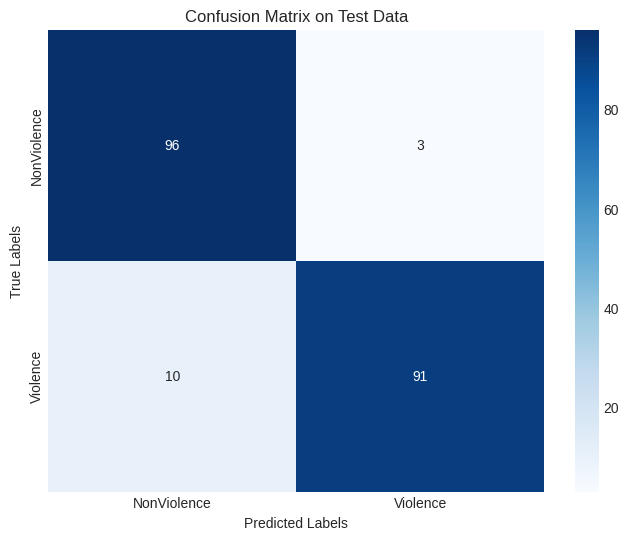


Evaluating using model.evaluate()...
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.9425 - loss: 0.1464
Test Loss (from model.evaluate): 0.1725
Test Accuracy (from model.evaluate): 0.9350
Test compile_metrics (from model.evaluate): 0.9350

--- Evaluation on Test Data Finished ---


In [5]:
# Prerequisites for this cell:
# 1. MoBiLSTM_model: Your trained Keras model object.
#    - This could be the model still in memory after `model.fit()`.
#    - Or, if you've restarted, you'd load it first:
#      if os.path.exists(MODEL_H5_PATH):
#          print(f"Loading trained model from {MODEL_H5_PATH} for testing...")
#          MoBiLSTM_model = load_model(MODEL_H5_PATH)
#          print("Model loaded successfully.")
#      else:
#          print(f"ERROR: Trained model not found at {MODEL_H5_PATH}. Cannot perform testing.")
#          MoBiLSTM_model = None # Or handle error
#
# 2. features_test: Your preprocessed test features (NumPy array).
# 3. labels_test: Your one-hot encoded test labels (NumPy array).
# 4. CLASSES_LIST: List of your class names (e.g., ["NonViolence", "Violence"]).

# Ensure necessary imports for metrics are present (usually done at the top of the script)
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import seaborn as sns # For plotting confusion matrix
import matplotlib.pyplot as plt # For plotting

# Check if model and test data are available
if 'MoBiLSTM_model' in locals() and MoBiLSTM_model is not None and \
   'features_test' in locals() and features_test.size > 0 and \
   'labels_test' in locals() and labels_test.size > 0:

    print("\n--- Starting Evaluation on Test Data ---")

    # 1. Make Predictions on the Test Set
    print("Predicting on the test set...")
    # MoBiLSTM_model.predict() returns probabilities for each class
    labels_predict_probs = MoBiLSTM_model.predict(features_test, batch_size=BATCH_SIZE) # Use the same batch size as training or a suitable one

    # Convert probabilities to class labels (index of the max probability)
    labels_predict_classes = np.argmax(labels_predict_probs, axis=1)

    # Convert one-hot encoded true labels_test to class indices as well for comparison
    labels_test_actual_classes = np.argmax(labels_test, axis=1)

    print(f"Predicted {len(labels_predict_classes)} samples.")

    # 2. Calculate and Print Accuracy
    accuracy = accuracy_score(labels_test_actual_classes, labels_predict_classes)
    print(f"\nTest Accuracy: {accuracy * 100:.2f}%")

    # 3. Display Classification Report
    print("\nClassification Report:")
    try:
        report = classification_report(labels_test_actual_classes, labels_predict_classes, target_names=CLASSES_LIST, digits=4)
        print(report)
    except ValueError as e:
        print(f"Could not generate classification report: {e}")
        print("This might be due to an issue with the predicted classes vs actual classes (e.g., some classes not predicted).")


    # 4. Display Confusion Matrix
    print("\nConfusion Matrix:")
    cm = confusion_matrix(labels_test_actual_classes, labels_predict_classes)

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues',
                xticklabels=CLASSES_LIST, yticklabels=CLASSES_LIST)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix on Test Data')
    plt.show()

    # 5. Optional: Evaluate using model.evaluate()
    # This gives loss and metrics defined during model.compile()
    print("\nEvaluating using model.evaluate()...")
    # Ensure BATCH_SIZE is defined or use a default like 32
    if 'BATCH_SIZE' not in locals(): BATCH_SIZE = 8 # or 16, 32

    eval_results = MoBiLSTM_model.evaluate(features_test, labels_test, batch_size=BATCH_SIZE, verbose=1)
    print(f"Test Loss (from model.evaluate): {eval_results[0]:.4f}")
    # The second metric is usually accuracy if specified in compile()
    if len(eval_results) > 1:
        print(f"Test Accuracy (from model.evaluate): {eval_results[1]:.4f}")
        for i, metric_name in enumerate(MoBiLSTM_model.metrics_names):
             if i > 0 : # skip loss
                print(f"Test {metric_name} (from model.evaluate): {eval_results[i]:.4f}")


    print("\n--- Evaluation on Test Data Finished ---")

else:
    if not ('MoBiLSTM_model' in locals() and MoBiLSTM_model is not None):
        print("Model not available or not loaded. Skipping testing.")
    if not ('features_test' in locals() and features_test.size > 0):
        print("Test features not available. Skipping testing.")
    if not ('labels_test' in locals() and labels_test.size > 0):
        print("Test labels not available. Skipping testing.")


--- Plotting Model Training History ---


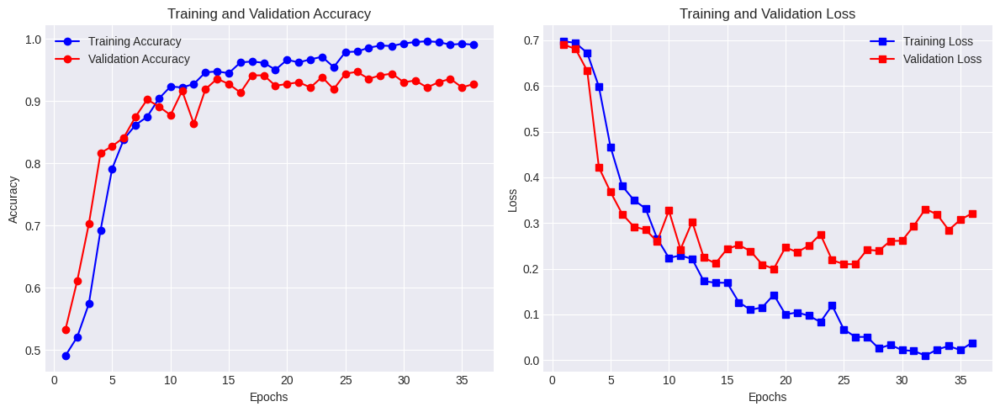

Learning rate ('lr') not found in history. This is normal if ReduceLROnPlateau didn't trigger or isn't logged by default.

--- Plotting Finished ---


In [6]:
import matplotlib.pyplot as plt

# Prerequisite:
# MobBiLSTM_model_history: The History object returned by MoBiLSTM_model.fit()
#                        It should be in memory if training just completed in the same session.

# Check if the history object exists and has the 'history' attribute
if 'MobBiLSTM_model_history' in locals() and \
   MobBiLSTM_model_history is not None and \
   hasattr(MobBiLSTM_model_history, 'history'):

    print("\n--- Plotting Model Training History ---")

    history_dict = MobBiLSTM_model_history.history

    # 1. Plot Training & Validation Accuracy
    acc = history_dict.get('accuracy')
    val_acc = history_dict.get('val_accuracy')
    epochs = range(1, len(acc) + 1) if acc else []

    if acc and val_acc:
        plt.figure(figsize=(12, 5))
        plt.subplot(1, 2, 1) # 1 row, 2 columns, 1st subplot
        plt.plot(epochs, acc, 'bo-', label='Training Accuracy') # 'bo-' for blue dots and line
        plt.plot(epochs, val_acc, 'ro-', label='Validation Accuracy') # 'ro-' for red dots and line
        plt.title('Training and Validation Accuracy')
        plt.xlabel('Epochs')
        plt.ylabel('Accuracy')
        plt.legend()
        plt.grid(True)
    else:
        print("Accuracy keys ('accuracy', 'val_accuracy') not found in history.")

    # 2. Plot Training & Validation Loss
    loss = history_dict.get('loss')
    val_loss = history_dict.get('val_loss')
    # epochs range is the same as for accuracy if accuracy was plotted

    if loss and val_loss:
        plt.subplot(1, 2, 2) # 1 row, 2 columns, 2nd subplot
        plt.plot(epochs, loss, 'bs-', label='Training Loss') # 'bs-' for blue squares and line
        plt.plot(epochs, val_loss, 'rs-', label='Validation Loss') # 'rs-' for red squares and line
        plt.title('Training and Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True)
    else:
        print("Loss keys ('loss', 'val_loss') not found in history.")

    plt.tight_layout() # Adjusts subplot params for a tight layout.
    plt.show()

    # 3. Optional: Plot Learning Rate (if ReduceLROnPlateau was used and 'lr' is logged)
    lr = history_dict.get('lr')
    if lr:
        plt.figure(figsize=(8, 5))
        plt.plot(epochs, lr, 'go-', label='Learning Rate')
        plt.title('Learning Rate over Epochs')
        plt.xlabel('Epochs')
        plt.ylabel('Learning Rate')
        plt.legend()
        plt.grid(True)
        plt.show()
    else:
        print("Learning rate ('lr') not found in history. This is normal if ReduceLROnPlateau didn't trigger or isn't logged by default.")

    print("\n--- Plotting Finished ---")

elif 'MobBiLSTM_model_history' in locals() and MobBiLSTM_model_history is not None:
    print("The 'MobBiLSTM_model_history' object does not have a 'history' attribute.")
    print("This might happen if model.fit() did not run correctly or the history object is malformed.")
else:
    print("Model training history ('MobBiLSTM_model_history') not found.")
    print("Please ensure model.fit() has been run in the current session to generate history.")

In [11]:
# --- IMPORTS NEEDED FOR THIS CELL ---
import os
import cv2
import numpy as np
# Note: tensorflow.keras.models.load_model is NOT needed here if MoBiLSTM_model is already loaded
# from tensorflow.keras.models import load_model
from collections import deque
from IPython.display import HTML, display # display is crucial here
from base64 import b64encode
from google.colab import files # For uploading
import shutil # For moving the uploaded file (optional)

# --- ENSURE THESE CONSTANTS ARE DEFINED (or define them here if not globally available) ---
# These would typically be defined in your initial setup cells.
# If you are running this cell in isolation after restarting and only loading the model,
# you might need to redefine them or ensure the cells defining them have been run.
# For this example, I'll assume they are available from previous cells.
# If not, uncomment and set them:
# IMAGE_HEIGHT, IMAGE_WIDTH = 64, 64
# SEQUENCE_LENGTH = 16
# CLASSES_LIST = ["NonViolence", "Violence"]
# MoBiLSTM_model = # ... ensure this is loaded from your .h5 file if not in memory ...

# --- Helper Function: Play Video (re-defined for self-containment) ---
def Play_Video_In_Colab(filepath):
    if not os.path.exists(filepath):
        print(f"Error: Video file not found at {filepath}")
        return HTML(f"<p>Error: Video file not found at {filepath}</p>")
    html_content = ''
    try:
        with open(filepath, 'rb') as video_file:
            video_data = video_file.read()
        src = 'data:video/mp4;base64,' + b64encode(video_data).decode()
        html_content += '<video width=640 muted controls autoplay loop><source src="%s" type="video/mp4"></video>' % src
    except Exception as e:
        print(f"Error reading or encoding video file {filepath}: {e}")
        return HTML(f"<p>Error processing video file: {e}</p>")
    return HTML(html_content)

# --- Helper Function: Frame Extraction (re-defined for self-containment) ---
def frames_extraction_for_prediction(video_path):
    frames_list = []
    video_reader = cv2.VideoCapture(video_path)
    if not video_reader.isOpened():
        print(f"Error: Could not open video file {video_path}")
        return []

    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    # Ensure SEQUENCE_LENGTH is defined
    if 'SEQUENCE_LENGTH' not in globals() or 'IMAGE_HEIGHT' not in globals() or 'IMAGE_WIDTH' not in globals():
        print("Error: SEQUENCE_LENGTH, IMAGE_HEIGHT, or IMAGE_WIDTH not defined.")
        return []

    skip_frames_window = max(int(video_frames_count / SEQUENCE_LENGTH), 1)

    for frame_counter in range(SEQUENCE_LENGTH):
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
        success, frame = video_reader.read()
        if not success:
            break
        try:
            resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
            normalized_frame = resized_frame / 255.0
            frames_list.append(normalized_frame)
        except Exception as e:
            print(f"Error processing frame {frame_counter}: {e}")
            # Optionally, decide how to handle frame processing errors (e.g., skip frame)

    video_reader.release()
    return frames_list

# --- Main Prediction Function ---
def predict_on_new_video_standalone(model_to_use):
    # Check if essential constants and model are available
    if model_to_use is None:
        print("Model is not loaded. Cannot predict.")
        return
    if 'SEQUENCE_LENGTH' not in globals() or 'CLASSES_LIST' not in globals():
        print("Error: SEQUENCE_LENGTH or CLASSES_LIST not defined globally. Please run setup cells.")
        return

    # --- Upload the video file ---
    print("Please upload a new video file (e.g., .mp4):")
    try:
        uploaded = files.upload()
    except Exception as e:
        print(f"An error occurred during file upload: {e}")
        return

    if not uploaded:
        print("No file was uploaded.")
        return

    video_filename = list(uploaded.keys())[0]
    # Note: files.upload() saves the file to the current working directory in Colab.
    # The filename might be slightly changed by Colab if a file with the same name exists (e.g., "video (1).mp4").
    # The `video_filename` variable holds the actual name Colab used.
    video_path = video_filename
    print(f"Uploaded video, using path: {video_path}")

    # --- Display the uploaded video ---
    print("\nPlaying uploaded video:")
    display(Play_Video_In_Colab(video_path)) # Uses the re-defined Play_Video_In_Colab

    # --- Preprocess the video ---
    print(f"\nExtracting frames from {video_path}...")
    frames = frames_extraction_for_prediction(video_path) # Uses the re-defined frames_extraction

    if len(frames) != SEQUENCE_LENGTH:
        print(f"Could not extract exactly {SEQUENCE_LENGTH} frames. Extracted {len(frames)}.")
        if not frames:
             print("No frames extracted. Cannot predict.")
             return
        print("Attempting to pad frames...")
        # Simple padding by repeating the last frame
        while len(frames) < SEQUENCE_LENGTH and len(frames) > 0:
            frames.append(frames[-1].copy()) # Use .copy() to avoid issues with modifying the same object
        if len(frames) != SEQUENCE_LENGTH: # Check again after padding
            print("Failed to prepare enough frames after padding. Cannot predict.")
            return
        print(f"Frames padded to {SEQUENCE_LENGTH}.")

    frames_np = np.asarray(frames)
    input_frames = np.expand_dims(frames_np, axis=0)

    # --- Make Prediction ---
    print("\nMaking prediction...")
    try:
        predictions = model_to_use.predict(input_frames, verbose=0)
    except Exception as e:
        print(f"Error during model prediction: {e}")
        return

    predicted_class_index = np.argmax(predictions[0])
    predicted_class_label = CLASSES_LIST[predicted_class_index]
    confidence = predictions[0][predicted_class_index]

    # --- Display Result ---
    print("\n--- Prediction Result ---")
    print(f"Predicted Class: {predicted_class_label}")
    print(f"Confidence: {confidence:.4f}")
    print(f"Probabilities: {CLASSES_LIST[0]}={predictions[0][0]:.4f}, {CLASSES_LIST[1]}={predictions[0][1]:.4f}")
    print("-------------------------\n")

    # Optional: Clean up the uploaded file
    # try:
    #     if os.path.exists(video_path):
    #         os.remove(video_path)
    #         print(f"Cleaned up uploaded file: {video_path}")
    # except OSError as e:
    #     print(f"Error removing file {video_path}: {e}")

# --- Call the prediction function ---
# IMPORTANT: Ensure MoBiLSTM_model is loaded and constants are defined before running this.
# This cell assumes `MoBiLSTM_model`, `SEQUENCE_LENGTH`, `IMAGE_HEIGHT`, `IMAGE_WIDTH`, `CLASSES_LIST`
# are already defined and available in the global scope from previous cells.

if 'MoBiLSTM_model' in globals() and MoBiLSTM_model is not None:
    predict_on_new_video_standalone(MoBiLSTM_model)
else:
    print("MoBiLSTM_model is not defined or not loaded. Please load the model first.")
    print("Make sure SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, and CLASSES_LIST are also defined from your setup cells.")

Please upload a new video file (e.g., .mp4):


Saving REUKNIGHT _ A Short Action Fight Scene.mp4 to REUKNIGHT _ A Short Action Fight Scene.mp4
Uploaded video, using path: REUKNIGHT _ A Short Action Fight Scene.mp4

Playing uploaded video:



Extracting frames from REUKNIGHT _ A Short Action Fight Scene.mp4...

Making prediction...

--- Prediction Result ---
Predicted Class: NonViolence
Confidence: 0.9700
Probabilities: NonViolence=0.9700, Violence=0.0300
-------------------------




--- Starting Evaluation on the Dataset's Test Split ---
Predicting on the test set...
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step

Test Accuracy on dataset split: 93.50%

Classification Report on dataset split:
              precision    recall  f1-score   support

 NonViolence     0.9057    0.9697    0.9366        99
    Violence     0.9681    0.9010    0.9333       101

    accuracy                         0.9350       200
   macro avg     0.9369    0.9353    0.9350       200
weighted avg     0.9372    0.9350    0.9349       200


Confusion Matrix on dataset split:


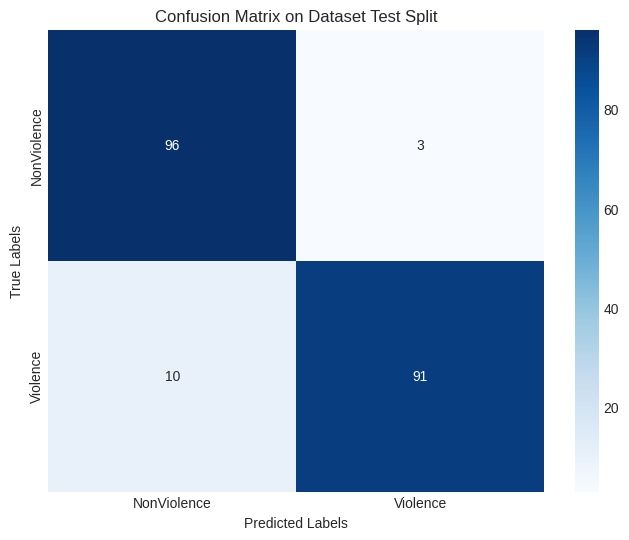


Evaluating using model.evaluate() on dataset split...
Test Loss (from model.evaluate): 0.1725
Test Accuracy (from model.evaluate): 0.9350

--- Evaluation on Dataset Test Split Finished ---


In [12]:

import os
import numpy as np
import tensorflow as tf # Not strictly needed here if model is just for predict, but good practice
from tensorflow.keras.models import load_model # If model needs to be reloaded
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# --- ENSURE THESE ARE DEFINED AND LOADED ---
# MoBiLSTM_model: Your trained model (either in memory or loaded from .h5)
# features_test: Your test features (e.g., from train_test_split)
# labels_test: Your one-hot encoded test labels
# CLASSES_LIST: ["NonViolence", "Violence"]
# BATCH_SIZE: The batch size used for training (or a suitable one for prediction)

# --- Optional: Load model if not already in memory ---
# DRIVE_BASE_PATH = '/content/drive/MyDrive/ViolenceDetectionProject_MobileNetBiLSTM/'
# MODEL_H5_PATH = os.path.join(DRIVE_BASE_PATH, "MoBiLSTM_model.h5")
# if 'MoBiLSTM_model' not in globals() or MoBiLSTM_model is None:
#     if os.path.exists(MODEL_H5_PATH):
#         print(f"Loading trained model from {MODEL_H5_PATH} for testing...")
#         MoBiLSTM_model = load_model(MODEL_H5_PATH)
#         print("Model loaded successfully.")
#     else:
#         print(f"ERROR: Trained model not found at {MODEL_H5_PATH}. Cannot perform testing.")
#         # Handle error appropriately, e.g., by not proceeding

# --- Check if model and test data are available ---
if 'MoBiLSTM_model' in globals() and MoBiLSTM_model is not None and \
   'features_test' in globals() and features_test.size > 0 and \
   'labels_test' in globals() and labels_test.size > 0 and \
   'CLASSES_LIST' in globals() and \
   'BATCH_SIZE' in globals() : # BATCH_SIZE for model.predict

    print("\n--- Starting Evaluation on the Dataset's Test Split ---")

    # 1. Make Predictions
    print("Predicting on the test set...")
    labels_predict_probs = MoBiLSTM_model.predict(features_test, batch_size=BATCH_SIZE)
    labels_predict_classes = np.argmax(labels_predict_probs, axis=1)
    labels_test_actual_classes = np.argmax(labels_test, axis=1)

    # 2. Accuracy
    accuracy = accuracy_score(labels_test_actual_classes, labels_predict_classes)
    print(f"\nTest Accuracy on dataset split: {accuracy * 100:.2f}%")

    # 3. Classification Report
    print("\nClassification Report on dataset split:")
    try:
        report = classification_report(labels_test_actual_classes, labels_predict_classes,
                                       target_names=CLASSES_LIST, digits=4)
        print(report)
    except ValueError as e:
        print(f"Could not generate classification report: {e}")

    # 4. Confusion Matrix
    print("\nConfusion Matrix on dataset split:")
    cm = confusion_matrix(labels_test_actual_classes, labels_predict_classes)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues',
                xticklabels=CLASSES_LIST, yticklabels=CLASSES_LIST)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix on Dataset Test Split')
    plt.show()

    # 5. model.evaluate()
    print("\nEvaluating using model.evaluate() on dataset split...")
    eval_results = MoBiLSTM_model.evaluate(features_test, labels_test, batch_size=BATCH_SIZE, verbose=0) # verbose=0 for cleaner output
    print(f"Test Loss (from model.evaluate): {eval_results[0]:.4f}")
    if len(eval_results) > 1:
        print(f"Test Accuracy (from model.evaluate): {eval_results[1]:.4f}")

    print("\n--- Evaluation on Dataset Test Split Finished ---")

else:
    print("One or more required variables (MoBiLSTM_model, features_test, labels_test, CLASSES_LIST, BATCH_SIZE) are not defined.")
    print("Please ensure the model is trained/loaded and data is split.")


--- Visualizing Predictions for 3 Random Test Samples ---

Sample 1 (Index 107 from test set):
  Actual Class: NonViolence
  Predicted Class: NonViolence (Confidence: 0.9826)
  Result: CORRECT


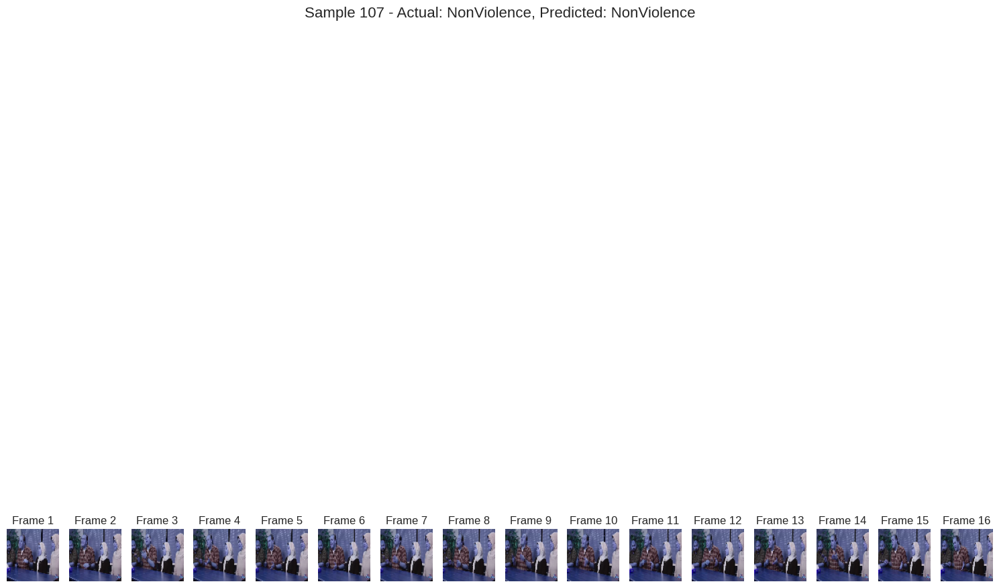

------------------------------

Sample 2 (Index 93 from test set):
  Actual Class: NonViolence
  Predicted Class: NonViolence (Confidence: 0.9976)
  Result: CORRECT


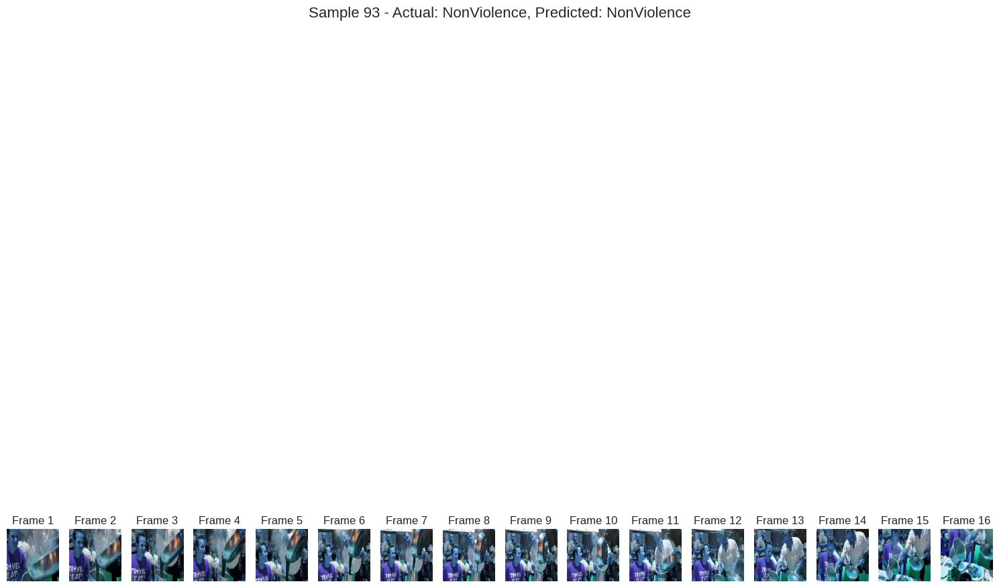

------------------------------

Sample 3 (Index 77 from test set):
  Actual Class: NonViolence
  Predicted Class: NonViolence (Confidence: 1.0000)
  Result: CORRECT


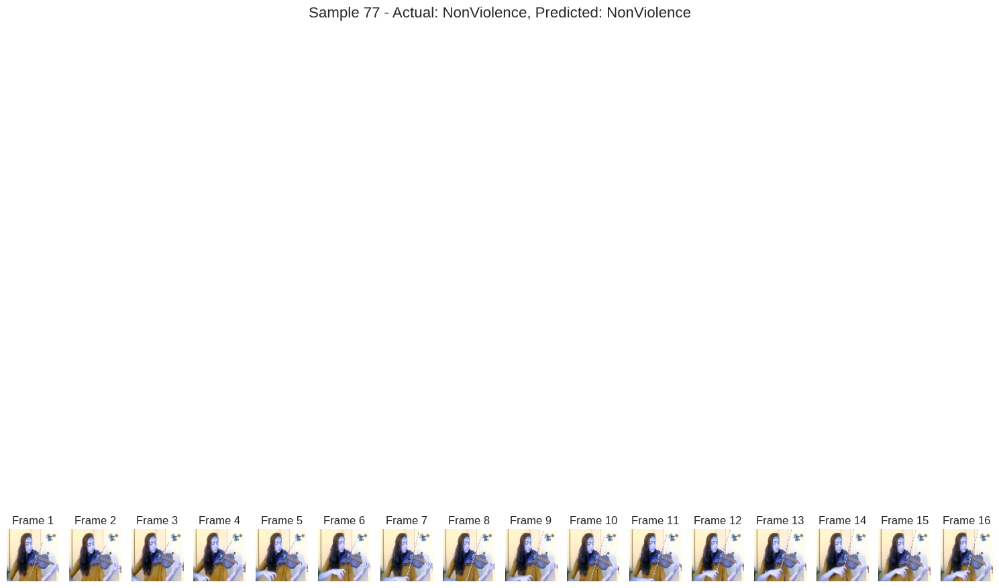

------------------------------


In [13]:
import random
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import HTML, display # For playing original video if paths are available
from base64 import b64encode

# --- ENSURE THESE ARE DEFINED AND LOADED ---
# MoBiLSTM_model: Your trained model
# features_test: Your test features
# labels_test: Your one-hot encoded test labels
# CLASSES_LIST: ["NonViolence", "Violence"]
# video_files_paths: The full list of original video paths (if you want to play original videos)
# train_test_split random_state: The random state used for train_test_split, if you want to map back to original videos

# --- Helper function to play original video (if you have the paths setup) ---
# (This is the same Play_Video_In_Colab function defined earlier)
def Play_Video_In_Colab(filepath):
    if not os.path.exists(filepath):
        return HTML(f"<p>Video not found: {filepath}</p>")
    html_content = ''
    try:
        with open(filepath, 'rb') as vf: video_data = vf.read()
        src = 'data:video/mp4;base64,' + b64encode(video_data).decode()
        html_content += f'<video width=320 controls loop><source src="{src}" type="video/mp4"></video>'
    except Exception as e:
        return HTML(f"<p>Error playing video: {e}</p>")
    return HTML(html_content)


# --- Function to display a sequence of frames ---
def display_frame_sequence(frames_sequence, title="Frame Sequence"):
    num_frames = frames_sequence.shape[0]
    plt.figure(figsize=(15, num_frames * 1)) # Adjust size as needed
    plt.suptitle(title, fontsize=16)
    for i in range(num_frames):
        plt.subplot(1, num_frames, i + 1)
        # Denormalize if needed for display, though matplotlib handles 0-1 floats well
        frame_to_display = frames_sequence[i]
        # If frames are normalized (0-1), matplotlib will display them correctly.
        # If they were, for example, -1 to 1, you might need to scale them back.
        plt.imshow(frame_to_display)
        plt.title(f"Frame {i+1}")
        plt.axis('off')
    plt.tight_layout(rect=[0, 0, 1, 0.96]) # Adjust rect to make space for suptitle
    plt.show()

# --- Select random samples and visualize ---
if 'MoBiLSTM_model' in globals() and MoBiLSTM_model is not None and \
   'features_test' in globals() and features_test.size > 0:

    num_samples_to_show = 3 # How many random samples to visualize
    num_test_samples = features_test.shape[0]

    if num_test_samples == 0:
        print("No samples in features_test to visualize.")
    else:
        random_indices = random.sample(range(num_test_samples), min(num_samples_to_show, num_test_samples))
        print(f"\n--- Visualizing Predictions for {len(random_indices)} Random Test Samples ---")

        for i, index in enumerate(random_indices):
            print(f"\nSample {i+1} (Index {index} from test set):")

            sample_features = features_test[index]  # Shape: (16, 64, 64, 3)
            sample_label_one_hot = labels_test[index]
            actual_label_index = np.argmax(sample_label_one_hot)
            actual_label_name = CLASSES_LIST[actual_label_index]

            # Model expects batch dimension
            prediction_input = np.expand_dims(sample_features, axis=0)
            prediction_probs = MoBiLSTM_model.predict(prediction_input, verbose=0)[0]
            predicted_label_index = np.argmax(prediction_probs)
            predicted_label_name = CLASSES_LIST[predicted_label_index]
            confidence = prediction_probs[predicted_label_index]

            print(f"  Actual Class: {actual_label_name}")
            print(f"  Predicted Class: {predicted_label_name} (Confidence: {confidence:.4f})")
            if actual_label_name == predicted_label_name:
                print("  Result: CORRECT")
            else:
                print("  Result: INCORRECT")

            # Display the sequence of processed frames
            display_frame_sequence(sample_features, title=f"Sample {index} - Actual: {actual_label_name}, Predicted: {predicted_label_name}")

            # --- Optional: If you want to play the ORIGINAL video segment ---
            # This requires having split `video_files_paths` correctly.
            # Let's assume you have `video_files_paths_test` available.
            # This part is more complex because `features_test` was shuffled.
            # To do this properly, you need to ensure `video_files_paths` was split
            # with the SAME `random_state` as `features` and `labels`.

            # Example (conceptual, requires `video_files_paths_test` to be correctly aligned):
            # if 'video_files_paths_test' in globals() and index < len(video_files_paths_test):
            #     original_video_path = video_files_paths_test[index]
            #     print(f"  Original Video Path (for this segment): {original_video_path}")
            #     display(Play_Video_In_Colab(original_video_path)) # This plays the whole video, not just the segment
            # else:
            #     print("  Original video path not available or index out of bounds for visualization.")
            print("-" * 30)
else:
    print("Model or test features not available for visualizing predictions.")